# Image Generation with DCGAN

## What is DCGAN?

Deep Convolutional GAN is composed of convolutional layers without max pooling or fully connected layers. It uses convolutional stride and transposed convolution for the downsampling and the upsampling.
1. Replace all max pooling with convolutional stride
2. Use transposed convolution for upsampling.
3. Eliminate fully connected layers.
4. Use Batch normalization except the output layer for the generator and the input layer of the discriminator.
5. Use ReLU in the generator except for the output which uses tanh.
6. Use LeakyReLU in the discriminator.

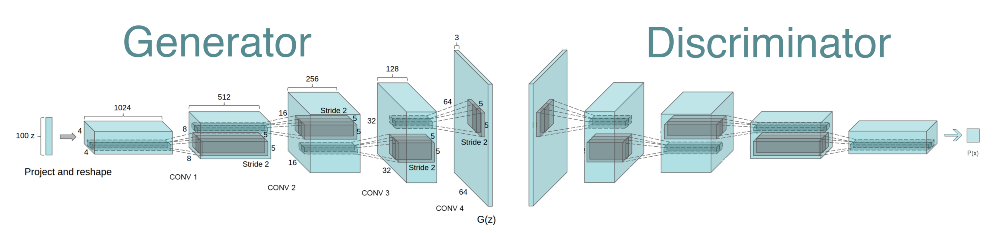

### Importing all the libraries

In [16]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
import torchvision.transforms as T
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manualSeed = 1702
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [17]:
DATA_DIR = '/kaggle/input/animefacedataset'
print(os.listdir(DATA_DIR))

['images']


In [18]:
print(os.listdir(DATA_DIR+'/images')[:10])

['35715_2011.jpg', '48610_2014.jpg', '34719_2011.jpg', '40266_2012.jpg', '4199_2002.jpg', '40739_2013.jpg', '42515_2013.jpg', '52482_2015.jpg', '46555_2014.jpg', '11579_2005.jpg']


### Some of the variables that we will be using

In [19]:
# Inputs for the run:
# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images
image_size = 64

# Number of channels
nc = 3

# Size of z latent vector
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 10

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available
ngpu = 1

stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [20]:
train_ds = ImageFolder(DATA_DIR, 
                       transform=T.Compose([
                           T.Resize(image_size),
                           T.CenterCrop(image_size),
                           T.ToTensor(),
                           T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
                       ]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True,
                      num_workers=3, pin_memory=True)

device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [7]:
print(device)

cpu


In [8]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

### Creating and previewing the dataset

In [9]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

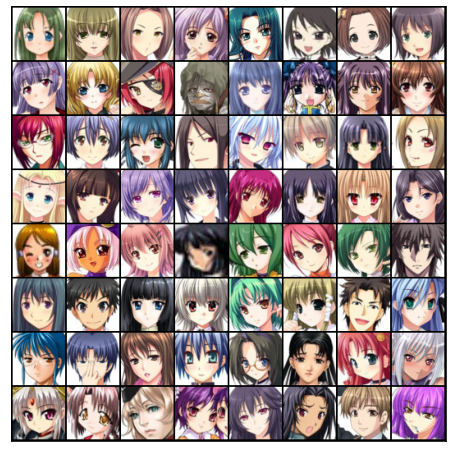

In [10]:
show_batch(train_dl)

## Implementing DCGAN

### Initializing the weights

In [11]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### Discriminator

In [17]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [18]:
d_model = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    d_model = nn.DataParallel(d_model, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
d_model.apply(weights_init)

print(d_model)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### Generator

In [19]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [20]:
# Create the generator
g_model = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    g_model = nn.DataParallel(g_model, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
g_model.apply(weights_init)

# Print the model
print(g_model)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### Training the model and initializing loss function

In [21]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimD = optim.Adam(d_model.parameters(), lr=lr, betas=(beta1, 0.999))
optimG = optim.Adam(g_model.parameters(), lr=lr, betas=(beta1, 0.999))

In [22]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(train_dl, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        d_model.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = d_model(real_cpu).view(-1)
        # Calculate loss on all-real batch
        d_err_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        d_err_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = g_model(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = d_model(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        d_err_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        d_err_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        d_err = d_err_real + d_err_fake
        # Update D
        optimD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        g_model.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = d_model(fake).view(-1)
        # Calculate G's loss based on this output
        g_err = criterion(output, label)
        # Calculate gradients for G
        g_err.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(train_dl),
                     d_err.item(), g_err.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(g_err.item())
        D_losses.append(d_err.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_dl)-1)):
            with torch.no_grad():
                fake = g_model(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/10][0/497]	Loss_D: 1.9072	Loss_G: 5.4495	D(x): 0.5695	D(G(z)): 0.6347 / 0.0071
[0/10][50/497]	Loss_D: 0.6830	Loss_G: 7.3842	D(x): 0.8031	D(G(z)): 0.0400 / 0.0022
[0/10][100/497]	Loss_D: 1.1740	Loss_G: 13.3044	D(x): 0.8360	D(G(z)): 0.4511 / 0.0000
[0/10][150/497]	Loss_D: 0.3897	Loss_G: 5.6028	D(x): 0.8735	D(G(z)): 0.1495 / 0.0067
[0/10][200/497]	Loss_D: 0.1988	Loss_G: 3.0495	D(x): 0.9638	D(G(z)): 0.1014 / 0.1041
[0/10][250/497]	Loss_D: 0.7756	Loss_G: 5.4523	D(x): 0.7826	D(G(z)): 0.3075 / 0.0076
[0/10][300/497]	Loss_D: 0.6504	Loss_G: 4.7077	D(x): 0.7364	D(G(z)): 0.2068 / 0.0163
[0/10][350/497]	Loss_D: 2.7489	Loss_G: 7.4138	D(x): 0.2022	D(G(z)): 0.0001 / 0.0012
[0/10][400/497]	Loss_D: 0.7936	Loss_G: 10.0615	D(x): 0.9125	D(G(z)): 0.4322 / 0.0001
[0/10][450/497]	Loss_D: 0.6817	Loss_G: 6.9984	D(x): 0.9027	D(G(z)): 0.3808 / 0.0016
[1/10][0/497]	Loss_D: 0.6790	Loss_G: 5.4143	D(x): 0.7939	D(G(z)): 0.2792 / 0.0063
[1/10][50/497]	Loss_D: 0.4447	Loss_G: 5.3937	D(x): 0.

### Results

Plotting loss during training

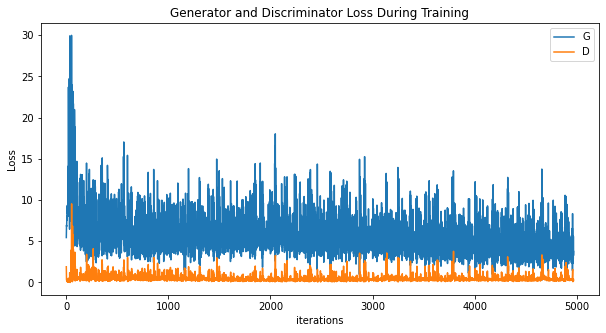

In [23]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Results

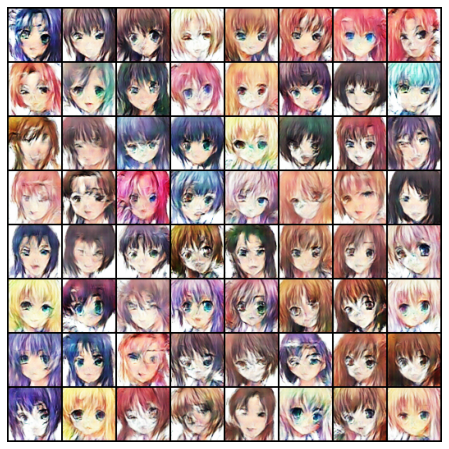

In [24]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

We will now change the network architecture and change latent vector from 100 to 50 and compare results

### New Discriminator

In [12]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, 32, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(32, ndf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [13]:
d_model = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    d_model = nn.DataParallel(d_model, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
d_model.apply(weights_init)

# Print the model
print(d_model)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### New Generator

In [14]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( 50, ngf * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( 32, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [15]:
# Create the generator
g_model = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    g_model = nn.DataParallel(g_model, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
g_model.apply(weights_init)

# Print the model
print(g_model)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(50, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(32, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


## Training the new model

In [30]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(train_dl, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        d_model.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = d_model(real_cpu).view(-1)
        # Calculate loss on all-real batch
        d_err_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        d_err_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = g_model(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = d_model(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        d_err_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        d_err_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        d_err = d_err_real + d_err_fake
        # Update D
        optimD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        g_model.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = d_model(fake).view(-1)
        # Calculate G's loss based on this output
        g_err = criterion(output, label)
        # Calculate gradients for G
        g_err.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(train_dl),
                     d_err.item(), g_err.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(g_err.item())
        D_losses.append(d_err.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_dl)-1)):
            with torch.no_grad():
                fake = g_model(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/10][0/497]	Loss_D: 1.6025	Loss_G: 1.4887	D(x): 0.3085	D(G(z)): 0.2591 / 0.2591
[0/10][50/497]	Loss_D: 1.6246	Loss_G: 1.4809	D(x): 0.2997	D(G(z)): 0.2595 / 0.2595
[0/10][100/497]	Loss_D: 1.6026	Loss_G: 1.4454	D(x): 0.3170	D(G(z)): 0.2734 / 0.2734
[0/10][150/497]	Loss_D: 1.6251	Loss_G: 1.4229	D(x): 0.3127	D(G(z)): 0.2742 / 0.2742
[0/10][200/497]	Loss_D: 1.5526	Loss_G: 1.4972	D(x): 0.3211	D(G(z)): 0.2603 / 0.2603
[0/10][250/497]	Loss_D: 1.5806	Loss_G: 1.4811	D(x): 0.3118	D(G(z)): 0.2557 / 0.2557
[0/10][300/497]	Loss_D: 1.7724	Loss_G: 1.4022	D(x): 0.2705	D(G(z)): 0.2852 / 0.2852
[0/10][350/497]	Loss_D: 1.6618	Loss_G: 1.4731	D(x): 0.2912	D(G(z)): 0.2630 / 0.2630
[0/10][400/497]	Loss_D: 1.6536	Loss_G: 1.4230	D(x): 0.3049	D(G(z)): 0.2795 / 0.2795
[0/10][450/497]	Loss_D: 1.6509	Loss_G: 1.4334	D(x): 0.2997	D(G(z)): 0.2739 / 0.2739
[1/10][0/497]	Loss_D: 1.5419	Loss_G: 1.5023	D(x): 0.3210	D(G(z)): 0.2493 / 0.2493
[1/10][50/497]	Loss_D: 1.6168	Loss_G: 1.5031	D(x): 0.30

### Plot

Plotting the loss during training

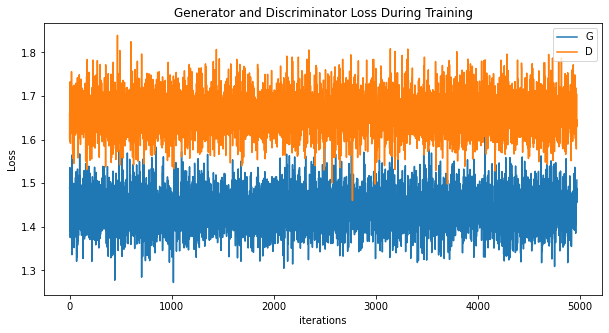

In [31]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

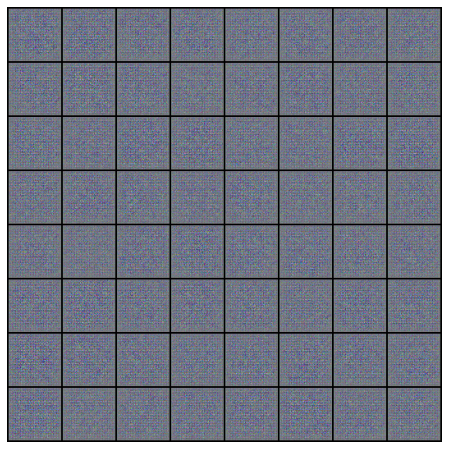

In [32]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

As can be seen, this new model has not shown good results. Hence the earlier model had a better combination of network architecure and latent spaces and fake images created looked good. Better images can be created if training model is allowed to train for more number of epochs.

## References

1. DCGAN - https://jonathan-hui.medium.com/gan-dcgan-deep-convolutional-generative-adversarial-networks-df855c438f
2. https://paperswithcode.com/method/dcgan#:~:text=DCGAN%2C%20or%20Deep%20Convolutional%20GAN,the%20generator%20and%20the%20discriminator.
3. Dataset - https://www.kaggle.com/datasets/splcher/animefacedataset
4. https://www.kaggle.com/code/splcher/starter-anime-face-dataset

## License

Copyright (c) 2022 Jay Devnani

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.